<a href="https://colab.research.google.com/github/jeric250/Data-Science-Projects/blob/main/Image_Classification_Detect_Unsafe_Images.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Use CNN to Identify Safe/Unsafe Images
The goal is to identify whether a given image is safe or unsafe. In this context, 'unsafe' images is defined as images containing excessive sexual and/or violent images for young children (say 5 years old or under). 4 approaches were used to build an image classifer:
1.   Build my own simple CNN from scratch
2.   Apply enhancements on simple CNN
3.   Use a pre- trained model as a feature extractor (transfer learning)
4.   Use and fine-tune a pre-trained model (transfer learning)

This is partly inspired by Nicholas Renotte's [video](https://youtu.be/jztwpsIzEGc?si=ijKOJWi0n1SMM7U5) on CNN image classifier.

## Part 1: Build a simple model

### Load Libraries and Data Location

In [ ]:
import os
import tensorflow as tf
import cv2
import imghdr # to check file extension
from matplotlib import pyplot as plt
import numpy as np

from tensorflow.keras.models import Sequential # functional allows more customization (e.g. multiple input)
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras import layers
from tensorflow.keras.models import Model

from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_dir = '/content/drive/MyDrive/Data/Image_Classification/data'
for image_class in os.listdir(data_dir):
    img_list = os.listdir(os.path.join(data_dir, image_class))
    print('No. of images in {} folder: {}'.format(image_class, len(img_list)))

# 186 unsafe, 184 safe

No. of images in unsafe folder: 186
No. of images in safe folder: 184


### Load Data

In [ ]:
# create data pipeline
# generates dataset from image files in directory
data_dir = '/content/drive/MyDrive/Data/Image_Classification/data'
data = tf.keras.utils.image_dataset_from_directory(data_dir)

Found 370 files belonging to 2 classes.


In [ ]:
# access data pipeline
data_iterator = data.as_numpy_iterator()

# obtain batch of images from iterator
# default shuffle in tf.keras.utils.image_dataset_from_directory is True
# make sure there is shuffle as when reading images from folder, all happy images are loaded first then sad images
batch = data_iterator.next()
len(batch) # tuple of size 2: 1 represents image (in array), 1 represents class

2

In [ ]:
# check shape of image array (represented as array) in tuple
batch[0].shape # default image_size in tf.keras.utils.image_dataset_from_directory is (256,256), with 3 channels

(32, 256, 256, 3)

In [ ]:
batch[1] # represent class

array([0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0,
       0, 1, 1, 1, 1, 1, 0, 0, 0, 0], dtype=int32)

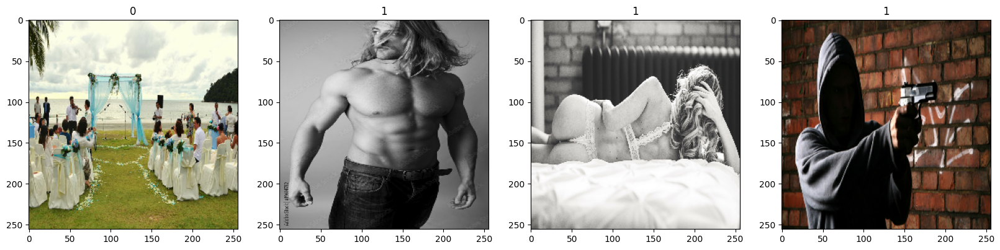

In [ ]:
# in this case, class 0 is safe and class 1 is unsafe
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])

### Scale Data (Preprocessing)

In [ ]:
# image values ranges from 0 to 255 (image size is (256,256))
# need to scale to between 0 and 1 by dividing by 255
print(batch[0].min())
print(batch[0].max())
print((batch[0]/255).max()) # now the max is 1

0.0
255.0
1.0


In [ ]:
# need to scale as part of data pipeline
# map here is a function from the tf.data.Dataset API
# other common functions: zip (combine features and labels), skip
# maybe rename as scaled_data
data = data.map(lambda x,y: (x/255, y)) # use x,y as x is image values and y is class

In [ ]:
# check scaled image values
batch = data.as_numpy_iterator().next()
print(batch[0][2].max()) # check image index 2
print(batch[0][20].max()) # check image index 20

0.99607843
1.0


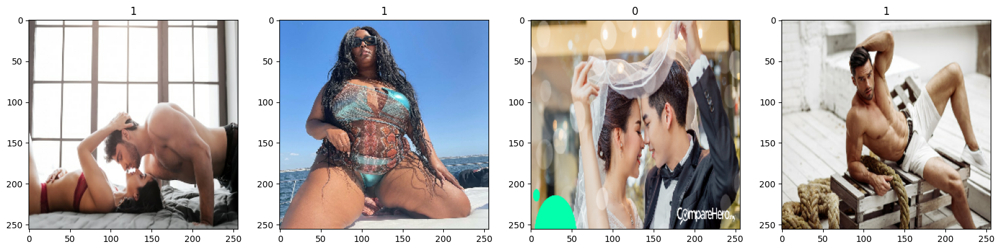

In [ ]:
# check scaled images still ok
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img) # img.astype(int) # can't cast as integer as image values are all between 0 and 1 now
    ax[idx].title.set_text(batch[1][idx])

### Split Data

In [ ]:
# 370 images, with batch size of 32 => 12 batches
len(data)

12

In [ ]:
# train, val used during training (val used to evaluate during training)
train_size = int(len(data)*.7)
val_size = int(len(data)*.2)
test_size = int(len(data)*.1) + 1

print(train_size, val_size, test_size) # equals 12 batches

8 2 2


In [ ]:
# take: how much data we are taking
# skip: skip data
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size+val_size).take(test_size)

print(len(train), len(val), len(test))

8 2 2


### Train Model

In [ ]:
model = Sequential()

In [ ]:
model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(256,256,3))) # 16 filters with 3x3 size, 1 stride
model.add(MaxPooling2D()) # condense output from relu

model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten()) # flatten before feeding into dense layer

model.add(Dense(256, activation='relu')) # fully connected layer with 256 neurons
model.add(Dense(1, activation='sigmoid')) # output is 0 or 1 (due to sigmoid)

In [ ]:
# use adam optimizer
model.compile('adam', loss=tf.losses.BinaryCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 16)        4624      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 16)       0

In [ ]:
hist = model.fit(train, epochs=20, validation_data=val)

Epoch 1/20
8/8 [==============================] - 22s 2s/step - loss: 0.9542 - accuracy: 0.4844 - val_loss: 0.6924 - val_accuracy: 0.4219
Epoch 2/20
8/8 [==============================] - 24s 2s/step - loss: 0.6862 - accuracy: 0.5000 - val_loss: 0.6642 - val_accuracy: 0.5938
Epoch 3/20
8/8 [==============================] - 27s 3s/step - loss: 0.6513 - accuracy: 0.6016 - val_loss: 0.6009 - val_accuracy: 0.6719
Epoch 4/20
8/8 [==============================] - 22s 2s/step - loss: 0.5783 - accuracy: 0.7070 - val_loss: 0.4918 - val_accuracy: 0.7969
Epoch 5/20
8/8 [==============================] - 25s 3s/step - loss: 0.5666 - accuracy: 0.6797 - val_loss: 0.5222 - val_accuracy: 0.7969
Epoch 6/20
8/8 [==============================] - 25s 3s/step - loss: 0.4744 - accuracy: 0.8438 - val_loss: 0.4318 - val_accuracy: 0.8125
Epoch 7/20
8/8 [==============================] - 21s 2s/step - loss: 0.4094 - accuracy: 0.8164 - val_loss: 0.3115 - val_accuracy: 0.9219
Epoch 8/20
8/8 [==================

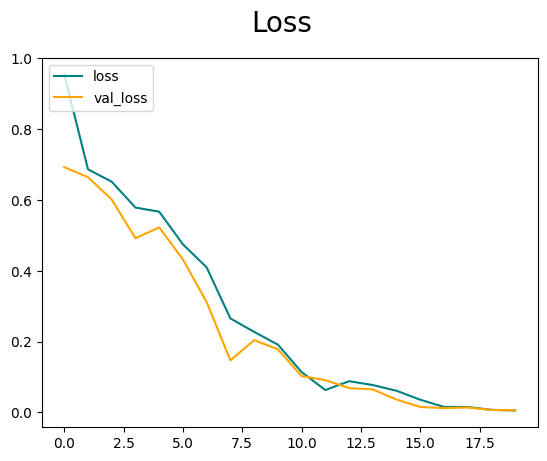

In [ ]:
# hist.history contains info log
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss') # training loss
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()
# if training loss drops but val loss does not, potentially need regularization (dropout) to address overfit

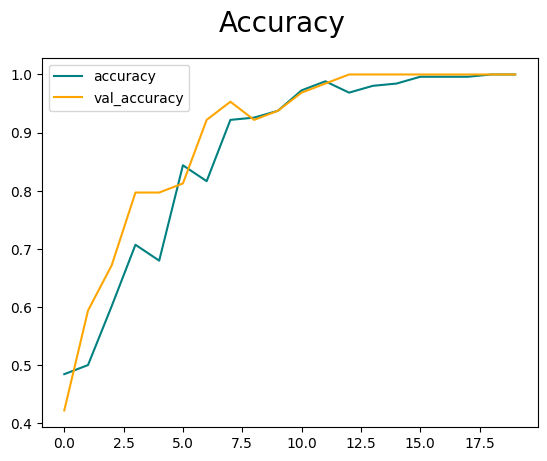

In [ ]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

### Evaluate Model

In [ ]:
# create empty lists to store true labels and predicted probabilities
true_labels = []
predicted_probs = []

# for each batch in test set (which has 2 batches with total 50 images), make prediction
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X) # use saved and reloaded model

    true_labels.extend(y)
    predicted_probs.extend(yhat)

# convert lists to arrays
true_labels = np.array(true_labels)
predicted_probs = np.array(predicted_probs)
print(true_labels.shape, predicted_probs.shape)

# compute predicted classes based on a threshold
predicted_classes = np.where(predicted_probs > 0.5, 1, 0)
print(predicted_classes.shape)

1/1 [==============================] - 0s 432ms/step
(50,) (50, 1)
(50, 1)


Precision: 1.0
Recall: 1.0
F1: 1.0
ROC-AUC Score: 1.0
Log Loss: 0.00567038687292978




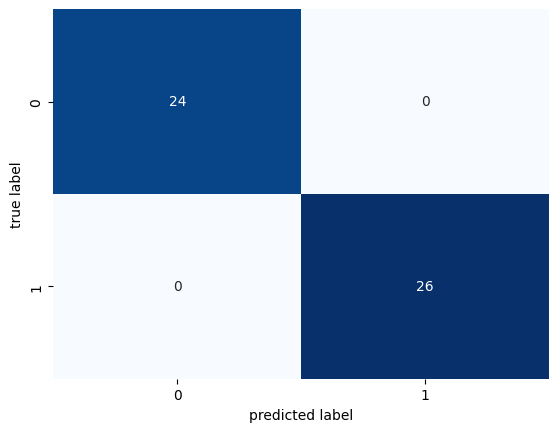

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, log_loss, roc_auc_score
import seaborn as sns

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_classes)

# Compute perf metrics
precision = precision_score(true_labels, predicted_classes)
recall = recall_score(true_labels, predicted_classes)
f1 = f1_score(true_labels, predicted_classes) # do not name variable 'f1_score' as it is already a method
roc_auc = roc_auc_score(true_labels, predicted_probs)
logloss = log_loss(true_labels, predicted_probs)

sns.heatmap(conf_matrix, cmap='Blues', annot=True, fmt='g', cbar=False)
plt.xlabel('predicted label')
plt.ylabel('true label');

print("Precision:", precision)
print("Recall:", recall)
print("F1:", f1)
print("ROC-AUC Score:", roc_auc)
print("Log Loss:", logloss)
print("\n")

### Test Using New Unseen Images

In [ ]:
# obtain folder or filename inside
data_dir = '/content/drive/MyDrive/Data/Image_Classification/unseen'
os.listdir(data_dir)

['taking-sexy-photos-outside_s.jpg',
 'couple-love-hugs-amazing-tropical-beach-wearing-stylish-swimwear_273443-4830.jpg',
 '17383351-male-model-with-hot-body-wrapped-in-business-shirt-wearing-eyeglasses.jpg',
 '-1x-1.jpg',
 '-are-dead-blur-robber-with-black-balaclava-aiming-with-pistol-the-2039795744.jpg',
 'bu-today-gun-violence.jpeg',
 'art_jf20_page_41_image_0001.jpg',
 'gang-crime-image-lit-low-key-showing-violent-man-holding-knife-39673307.jpg',
 'The-Guide-to-Registration-of-Marriage-in-Malaysia.jpg',
 '_128872051_gettyimages-1247777025.jpg',
 '6-Reasons-to-Celebrate-Other-Peoples-Success.jpg',
 '2014-05-29-iStockHuffPostCelebrationMay2920142-thumb.jpg']

In [ ]:
img_list = os.listdir(data_dir)
print('No. of images in unseen folder: {}'.format(len(img_list)))

No. of images in unseen folder: 12


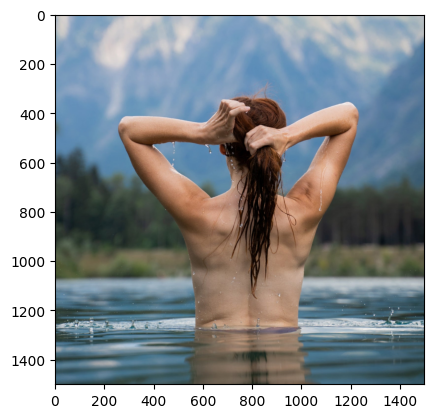

1/1 [==============================] - 0s 379ms/step
[[0.00223831]]




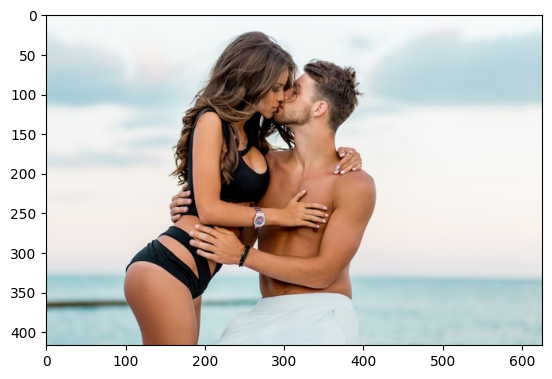

1/1 [==============================] - 0s 65ms/step
[[0.01559469]]




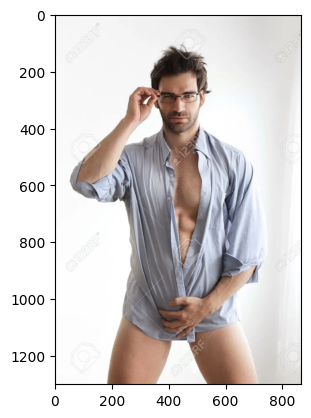

1/1 [==============================] - 0s 55ms/step
[[0.1006123]]




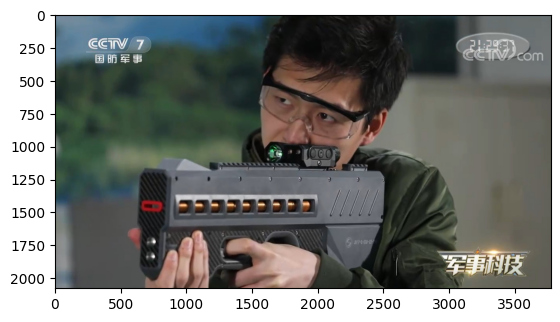

1/1 [==============================] - 0s 50ms/step
[[0.64178026]]




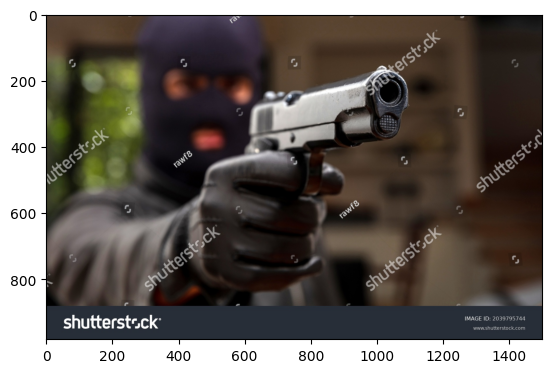

1/1 [==============================] - 0s 46ms/step
[[0.9927647]]




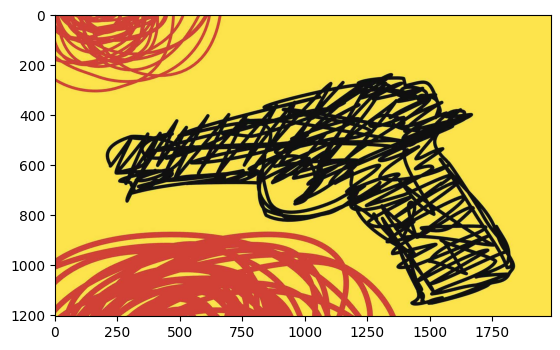

1/1 [==============================] - 0s 37ms/step
[[0.11965162]]




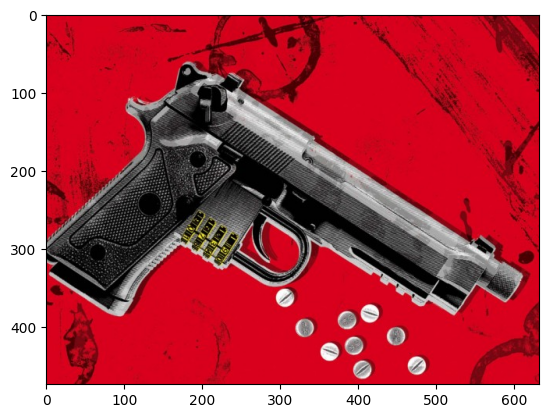

1/1 [==============================] - 0s 55ms/step
[[0.00187977]]




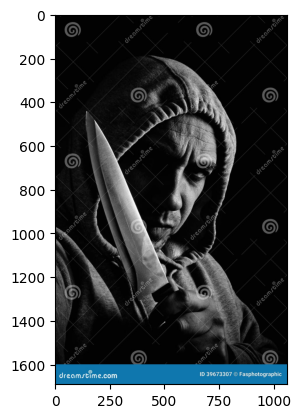

1/1 [==============================] - 0s 34ms/step
[[1.]]




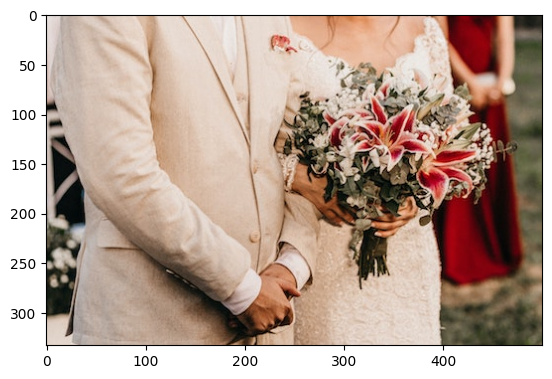

1/1 [==============================] - 0s 52ms/step
[[4.6777396e-07]]




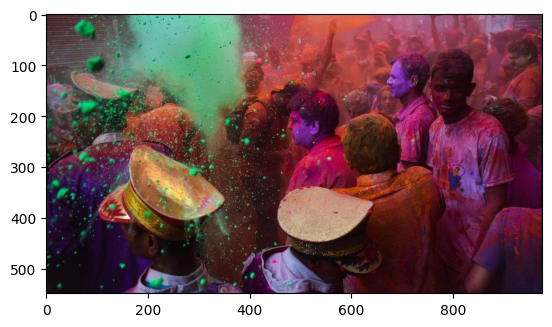

1/1 [==============================] - 0s 59ms/step
[[0.7366774]]




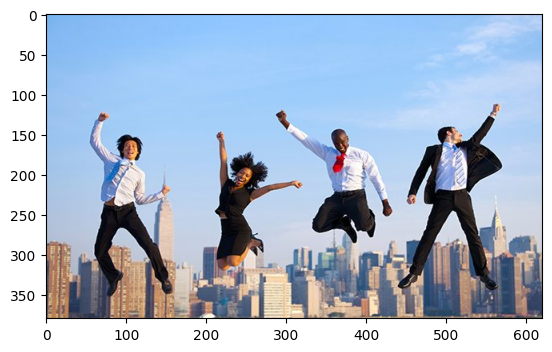

1/1 [==============================] - 0s 56ms/step
[[0.00161635]]




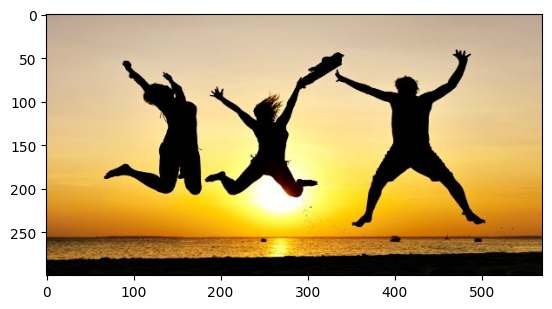

1/1 [==============================] - 0s 37ms/step
[[0.99945897]]




In [ ]:
pathway = '/content/drive/MyDrive/Data/Image_Classification/unseen/'
for image in img_list:
  img = cv2.imread(pathway+image)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show();

  resize = tf.image.resize(img, (256,256))
  yhat = base_model.predict(np.expand_dims(resize/255, 0))
  print(yhat)
  print("\n")

## Part 2: Apply enhancements on simple model

### Load Data

In [ ]:
data_dir = '/content/drive/MyDrive/Data/Image_Classification/data'
for image_class in os.listdir(data_dir):
    img_list = os.listdir(os.path.join(data_dir, image_class))
    print('No. of images in {} folder: {}'.format(image_class, len(img_list)))

# 186 unsafe, 184 safe

No. of images in unsafe folder: 186
No. of images in safe folder: 184


In [ ]:
# create data pipeline
# generates dataset from image files in directory
data_dir = '/content/drive/MyDrive/Data/Image_Classification/data'
data = tf.keras.utils.image_dataset_from_directory(data_dir)

Found 370 files belonging to 2 classes.


In [ ]:
# access data pipeline
data_iterator = data.as_numpy_iterator()

# obtain batch of images from iterator
# default shuffle in tf.keras.utils.image_dataset_from_directory is True
# make sure there is shuffle as when reading images from folder, all happy images are loaded first then sad images
batch = data_iterator.next()
len(batch) # tuple of size 2: 1 represents image (in array), 1 represents class

2

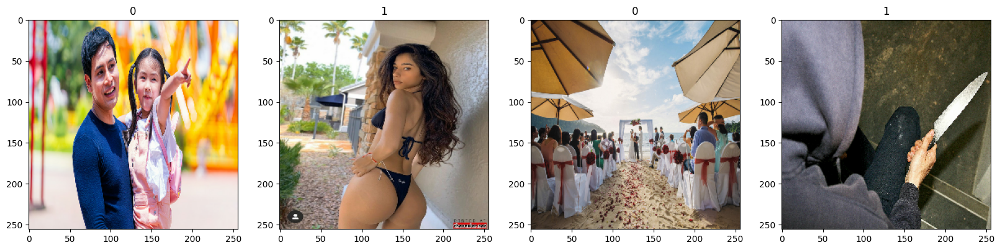

In [ ]:
# in this case, class 0 is safe and class 1 is unsafe
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])

### Apply Data Augmentation

In [ ]:
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.2),
  layers.RandomZoom(0.2),
  layers.RandomContrast(0.2),
  # layers.RandomBrightness(0.2),
  # layers.RandomBrightness([-0.8,0.8]),
  # layers.RandomCrop(224,224),
])

data_augmentation

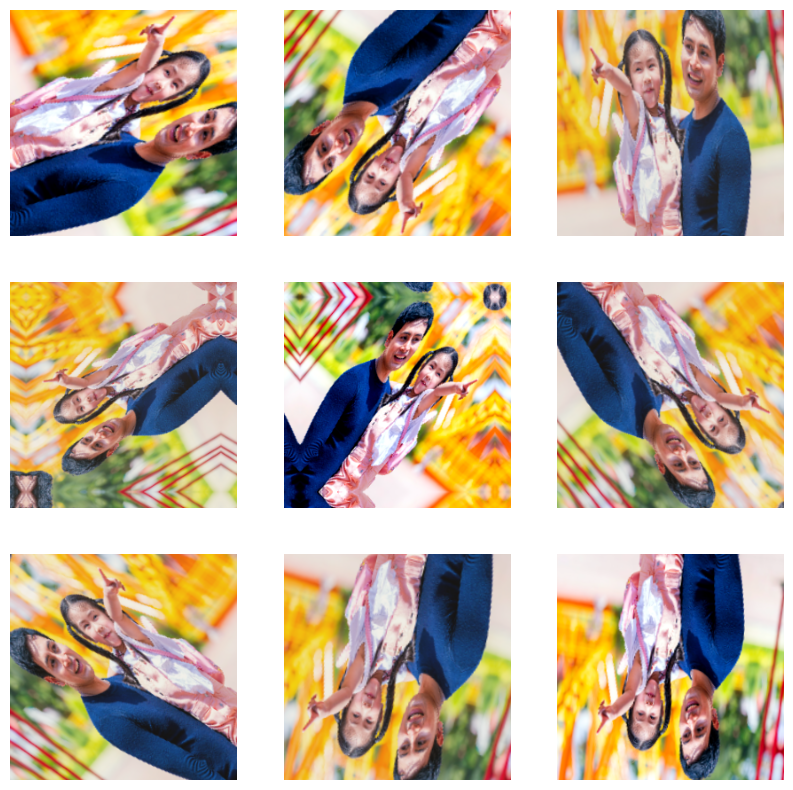

In [ ]:
# repeatedly apply augmentation layers to the same image and see the result
plt.figure(figsize=(10, 10))
first_image = batch[0][0]

for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
  plt.imshow(augmented_image[0] / 255)
  plt.axis('off')

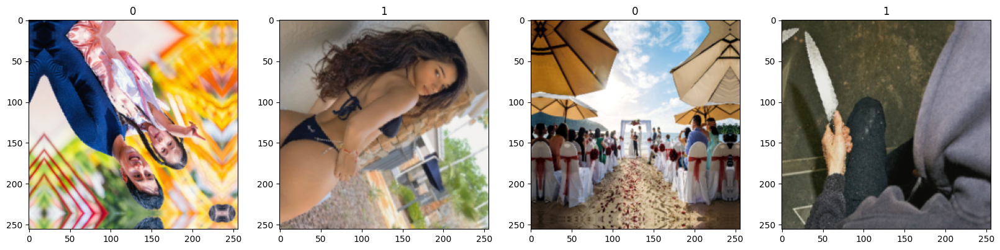

In [ ]:
# apply augmentation layers to the same sample 4 images from batch and see the result
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
  augmented_img = data_augmentation(tf.expand_dims(img, 0))
  ax[idx].imshow(augmented_img[0]/255)
  ax[idx].title.set_text(batch[1][idx])

In [ ]:
# rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1)
rescale = tf.keras.layers.Rescaling(1./255)

In [ ]:
# https://www.datacamp.com/tutorial/complete-guide-data-augmentation
rescale = tf.keras.layers.Rescaling(1./255)
AUTOTUNE = tf.data.AUTOTUNE  # Use buffered prefetching to load images from disk without having I/O become blocking

def prepare(ds, shuffle=False, augment=False):
    # Resize and rescale all datasets.
    ds = ds.map(lambda x, y: (rescale(x), y),
                num_parallel_calls=AUTOTUNE)

    if shuffle:
        ds = ds.shuffle(1000)

    # Use data augmentation only on the training set.
    if augment:
        ds = ds.map(lambda x, y: (data_augmentation(x, training=True), y),
                    num_parallel_calls=AUTOTUNE)

    # Use buffered prefetching on all datasets.
    return ds.prefetch(buffer_size=AUTOTUNE)

### Split Data

In [ ]:
# 370 images, with batch size of 32 => 12 batches
len(data)

12

In [ ]:
# train, val used during training (val used to evaluate during training)
train_size = int(len(data)*.7)
val_size = int(len(data)*.2)
test_size = int(len(data)*.1) + 1

print(train_size, val_size, test_size) # equals 12 batches

8 2 2


In [ ]:
# take: how much data we are taking
# skip: skip data
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size+val_size).take(test_size)

print(len(train), len(val), len(test))

8 2 2


In [ ]:
# apply augmentation only to training dataset
train_ds = prepare(train, shuffle=True, augment=True)
val_ds = prepare(val)
test_ds = prepare(test)

print(len(train_ds), len(val_ds), len(test_ds))
# data augmentation increases the number of image variations used during training but doesn't change the original images themselves
# The variations are created on-the-fly as the model trains, giving the model exposure to a wider range of scenarios and enhancing its ability to generalize to new, unseen images.

8 2 2


### Train Model

In [ ]:
model = Sequential()

In [ ]:
# input_shape=(256,256,3)
model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(256,256,3))) # 16 filters with 3x3 size, 1 stride
model.add(MaxPooling2D()) # condense output from relu

model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten()) # flatten before feeding into dense layer

model.add(Dropout(0.2))

model.add(Dense(256, activation='relu')) # fully connected layer with 256 neurons
model.add(Dense(1, activation='sigmoid')) # output is 0 or 1 (due to sigmoid)

In [ ]:
# use adam optimizer
model.compile('adam', loss=tf.losses.BinaryCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 16)        4624      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 16)      

In [ ]:
hist = model.fit(train_ds, epochs=12, validation_data=val_ds)

Epoch 1/12
8/8 [==============================] - 62s 5s/step - loss: 1.1178 - accuracy: 0.5391 - val_loss: 0.7219 - val_accuracy: 0.5469
Epoch 2/12
8/8 [==============================] - 50s 5s/step - loss: 0.6964 - accuracy: 0.5117 - val_loss: 0.6829 - val_accuracy: 0.5625
Epoch 3/12
8/8 [==============================] - 55s 5s/step - loss: 0.6827 - accuracy: 0.5039 - val_loss: 0.6714 - val_accuracy: 0.5625
Epoch 4/12
8/8 [==============================] - 41s 4s/step - loss: 0.7057 - accuracy: 0.5195 - val_loss: 0.6582 - val_accuracy: 0.7031
Epoch 5/12
8/8 [==============================] - 63s 7s/step - loss: 0.6827 - accuracy: 0.6016 - val_loss: 0.6828 - val_accuracy: 0.6562
Epoch 6/12
8/8 [==============================] - 50s 5s/step - loss: 0.6793 - accuracy: 0.6328 - val_loss: 0.6673 - val_accuracy: 0.6562
Epoch 7/12
8/8 [==============================] - 47s 4s/step - loss: 0.6575 - accuracy: 0.6680 - val_loss: 0.6542 - val_accuracy: 0.6406
Epoch 8/12
8/8 [==================

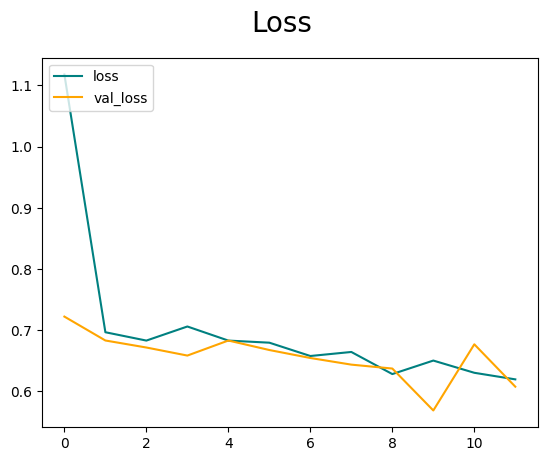

In [ ]:
# hist.history contains info log
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss') # training loss
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()
# if training loss drops but val loss does not, potentially need regularization (dropout) to address overfit

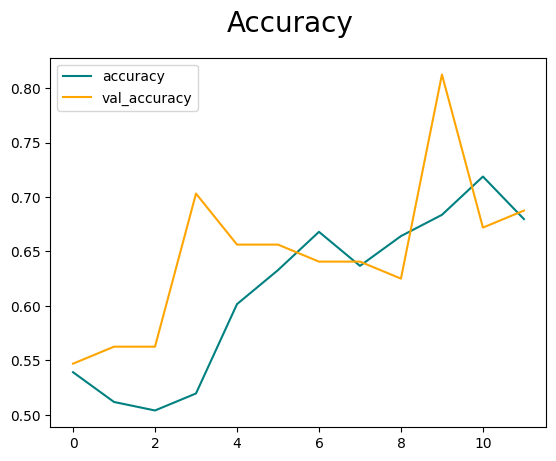

In [ ]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

### Evaluate Model

In [ ]:
# create empty lists to store true labels and predicted probabilities
true_labels = []
predicted_probs = []

# for each batch in test set (which has 2 batches with total 50 images), make prediction
for batch in test_ds.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)

    true_labels.extend(y)
    predicted_probs.extend(yhat)

# convert lists to arrays
true_labels = np.array(true_labels)
predicted_probs = np.array(predicted_probs)
print(true_labels.shape, predicted_probs.shape)

# compute predicted classes based on a threshold
predicted_classes = np.where(predicted_probs > 0.5, 1, 0)
print(predicted_classes.shape)

1/1 [==============================] - 0s 244ms/step
(50,) (50, 1)
(50, 1)


Precision: 0.7368421052631579
Recall: 0.56
F1: 0.6363636363636364
ROC-AUC Score: 0.7456
Log Loss: 0.6188165845469134




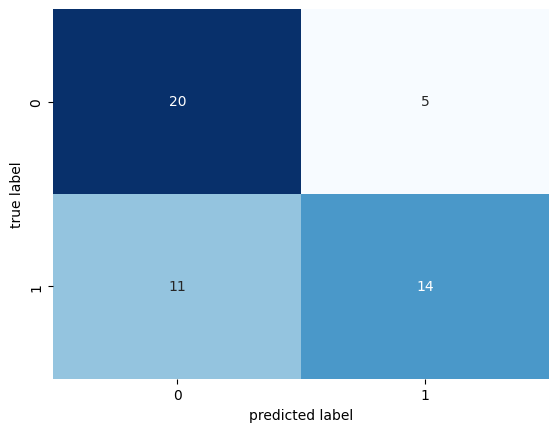

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, log_loss, roc_auc_score
import seaborn as sns

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_classes)

# Compute perf metrics
precision = precision_score(true_labels, predicted_classes)
recall = recall_score(true_labels, predicted_classes)
f1 = f1_score(true_labels, predicted_classes) # do not name variable 'f1_score' as it is already a method
roc_auc = roc_auc_score(true_labels, predicted_probs)
logloss = log_loss(true_labels, predicted_probs)

sns.heatmap(conf_matrix, cmap='Blues', annot=True, fmt='g', cbar=False)
plt.xlabel('predicted label')
plt.ylabel('true label');

print("Precision:", precision)
print("Recall:", recall)
print("F1:", f1)
print("ROC-AUC Score:", roc_auc)
print("Log Loss:", logloss)
print("\n")

### Test Using New Unseen Images

In [ ]:
# obtain folder or filename inside
data_dir = '/content/drive/MyDrive/Data/Image_Classification/unseen'
os.listdir(data_dir)

['taking-sexy-photos-outside_s.jpg',
 'couple-love-hugs-amazing-tropical-beach-wearing-stylish-swimwear_273443-4830.jpg',
 '17383351-male-model-with-hot-body-wrapped-in-business-shirt-wearing-eyeglasses.jpg',
 '-1x-1.jpg',
 '-are-dead-blur-robber-with-black-balaclava-aiming-with-pistol-the-2039795744.jpg',
 'bu-today-gun-violence.jpeg',
 'art_jf20_page_41_image_0001.jpg',
 'gang-crime-image-lit-low-key-showing-violent-man-holding-knife-39673307.jpg',
 'The-Guide-to-Registration-of-Marriage-in-Malaysia.jpg',
 '_128872051_gettyimages-1247777025.jpg',
 '6-Reasons-to-Celebrate-Other-Peoples-Success.jpg',
 '2014-05-29-iStockHuffPostCelebrationMay2920142-thumb.jpg']

In [ ]:
img_list = os.listdir(data_dir)
print('No. of images in unseen folder: {}'.format(len(img_list)))

No. of images in unseen folder: 12


In [ ]:
img_list

['taking-sexy-photos-outside_s.jpg',
 'couple-love-hugs-amazing-tropical-beach-wearing-stylish-swimwear_273443-4830.jpg',
 '17383351-male-model-with-hot-body-wrapped-in-business-shirt-wearing-eyeglasses.jpg',
 '-1x-1.jpg',
 '-are-dead-blur-robber-with-black-balaclava-aiming-with-pistol-the-2039795744.jpg',
 'bu-today-gun-violence.jpeg',
 'art_jf20_page_41_image_0001.jpg',
 'gang-crime-image-lit-low-key-showing-violent-man-holding-knife-39673307.jpg',
 'The-Guide-to-Registration-of-Marriage-in-Malaysia.jpg',
 '_128872051_gettyimages-1247777025.jpg',
 '6-Reasons-to-Celebrate-Other-Peoples-Success.jpg',
 '2014-05-29-iStockHuffPostCelebrationMay2920142-thumb.jpg']

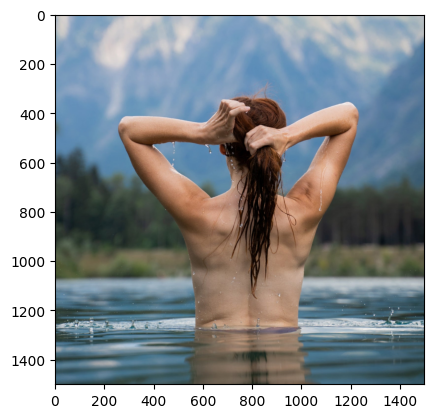

1/1 [==============================] - 0s 49ms/step
[[0.45961183]]




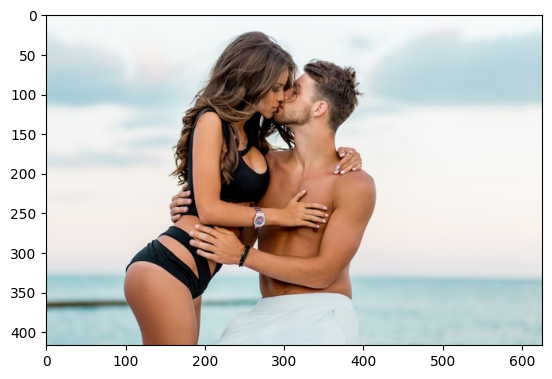

1/1 [==============================] - 0s 30ms/step
[[0.46049178]]




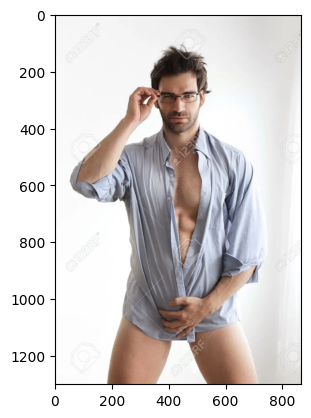

1/1 [==============================] - 0s 26ms/step
[[0.4588583]]




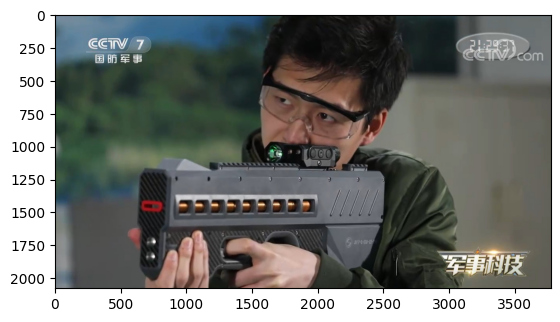

1/1 [==============================] - 0s 33ms/step
[[0.5747271]]




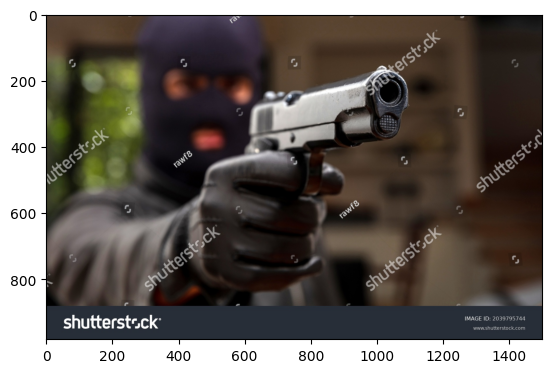

1/1 [==============================] - 0s 32ms/step
[[0.6290222]]




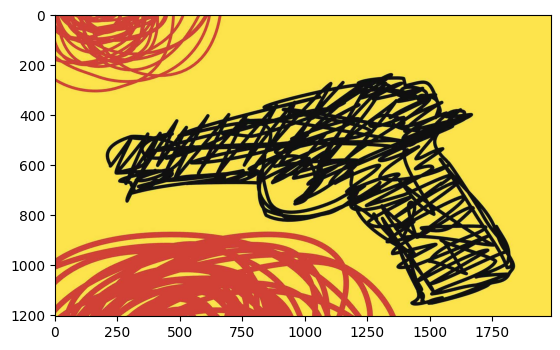

1/1 [==============================] - 0s 33ms/step
[[0.45890486]]




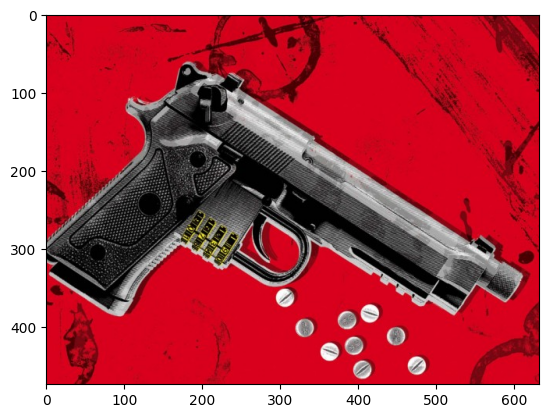

1/1 [==============================] - 0s 35ms/step
[[0.45987996]]




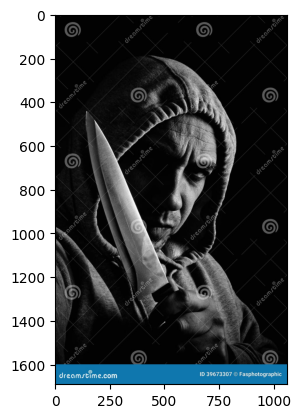

1/1 [==============================] - 0s 34ms/step
[[0.86779773]]




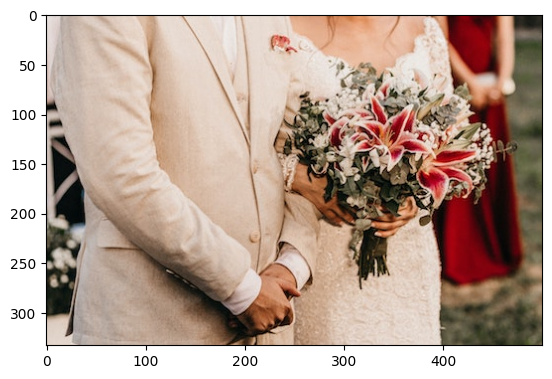

1/1 [==============================] - 0s 46ms/step
[[0.4594331]]




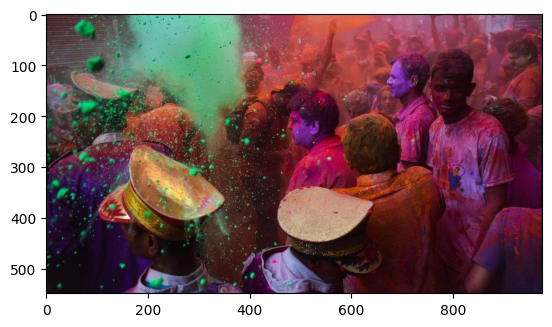

1/1 [==============================] - 0s 40ms/step
[[0.5200385]]




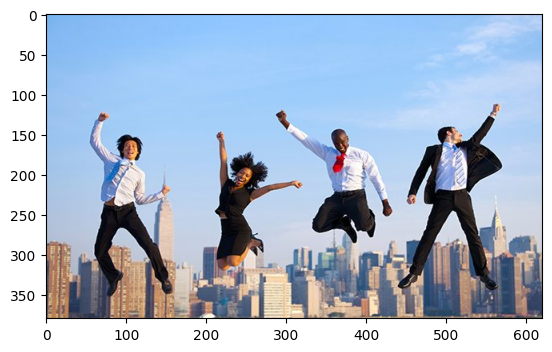

1/1 [==============================] - 0s 36ms/step
[[0.45847794]]




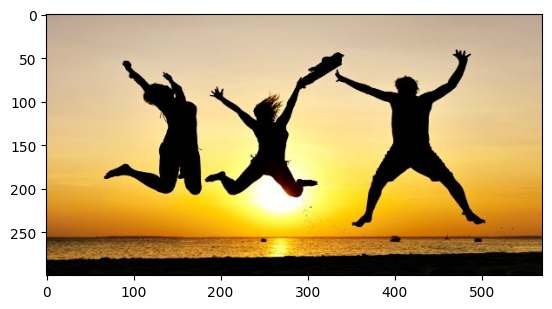

1/1 [==============================] - 0s 37ms/step
[[0.49123958]]




In [ ]:
pathway = '/content/drive/MyDrive/Data/Image_Classification/unseen/'
for image in img_list:
  img = cv2.imread(pathway+image)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show();

  resize = tf.image.resize(img, (256,256))
  yhat = model.predict(np.expand_dims(resize/255, 0))
  print(yhat)
  print("\n")

## Part 3: Transfer Learning (Feature Extraction)

### Load Libraries and Data Location

In [ ]:
from tensorflow.keras.applications import VGG16

In [ ]:
data_dir = '/content/drive/MyDrive/Data/Image_Classification/data'
for image_class in os.listdir(data_dir):
    img_list = os.listdir(os.path.join(data_dir, image_class))
    print('No. of images in {} folder: {}'.format(image_class, len(img_list)))

# 186 unsafe, 184 safe

No. of images in unsafe folder: 186
No. of images in safe folder: 184


In [ ]:
# create data pipeline
# generates dataset from image files in directory
# input_size = (224, 224)  # VGG16 input size
data_dir = '/content/drive/MyDrive/Data/Image_Classification/data'
data = tf.keras.utils.image_dataset_from_directory(data_dir, image_size=(224,224))

len(data) # 12 batches

Found 370 files belonging to 2 classes.


12

In [ ]:
# need to scale as part of data pipeline
# map here is a function from the tf.data.Dataset API
# other common functions: zip (combine features and labels), skip
# maybe rename as scaled_data
data = data.map(lambda x,y: (x/255, y)) # use x,y as x is image values and y is class

In [ ]:
# check scaled image values
batch = data.as_numpy_iterator().next()
print(batch[0][2].max()) # check image index 2
print(batch[0][20].max()) # check image index 20

1.0
1.0


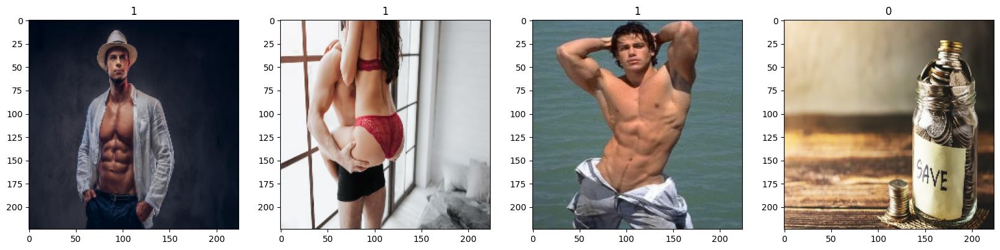

In [ ]:
# check scaled images still ok
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img) # img.astype(int) # can't cast as integer as image values are all between 0 and 1 now
    ax[idx].title.set_text(batch[1][idx])

### Split Data

In [ ]:
# train, val used during training (val used to evaluate during training)
train_size = int(len(data)*.7)
val_size = int(len(data)*.2)
test_size = int(len(data)*.1) + 1

print(train_size, val_size, test_size) # equals 12 batches

8 2 2


In [ ]:
# take: how much data we are taking
# skip: skip data
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size+val_size).take(test_size)

print(len(train), len(val), len(test))

8 2 2


In [ ]:
train

<_TakeDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

### Train Model

In [ ]:
# Load the pre-trained VGG16 model (excluding the top classification FC layers)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [ ]:
base_model

In [ ]:
print(base_model.input)
print(base_model.output)

KerasTensor(type_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_1'), name='input_1', description="created by layer 'input_1'")
KerasTensor(type_spec=TensorSpec(shape=(None, 7, 7, 512), dtype=tf.float32, name=None), name='block5_pool/MaxPool:0', description="created by layer 'block5_pool'")


In [ ]:
# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers for classification task
num_classes = 2
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(num_classes , activation='sigmoid')(x)

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)
# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy']) # 'binary_crossentropy' returns error later when training
model.summary()

# https://stackoverflow.com/questions/61742556/valueerror-shapes-none-1-and-none-2-are-incompatible
# https://www.kaggle.com/discussions/general/197993

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
hist = model.fit(train, epochs=10, validation_data=val)

Epoch 1/10
8/8 [==============================] - 140s 17s/step - loss: 0.5785 - accuracy: 0.7070 - val_loss: 0.5096 - val_accuracy: 0.7969
Epoch 2/10
8/8 [==============================] - 148s 18s/step - loss: 0.4544 - accuracy: 0.8008 - val_loss: 0.4822 - val_accuracy: 0.7969
Epoch 3/10
8/8 [==============================] - 143s 18s/step - loss: 0.4062 - accuracy: 0.8320 - val_loss: 0.4489 - val_accuracy: 0.7969
Epoch 4/10
8/8 [==============================] - 136s 17s/step - loss: 0.3773 - accuracy: 0.8242 - val_loss: 0.3344 - val_accuracy: 0.8594
Epoch 5/10
8/8 [==============================] - 138s 17s/step - loss: 0.3405 - accuracy: 0.8516 - val_loss: 0.4078 - val_accuracy: 0.7812
Epoch 6/10
8/8 [==============================] - 147s 18s/step - loss: 0.3589 - accuracy: 0.8438 - val_loss: 0.2967 - val_accuracy: 0.9062
Epoch 7/10
8/8 [==============================] - 147s 18s/step - loss: 0.3176 - accuracy: 0.8633 - val_loss: 0.3017 - val_accuracy: 0.9062
Epoch 8/10
8/8 [====

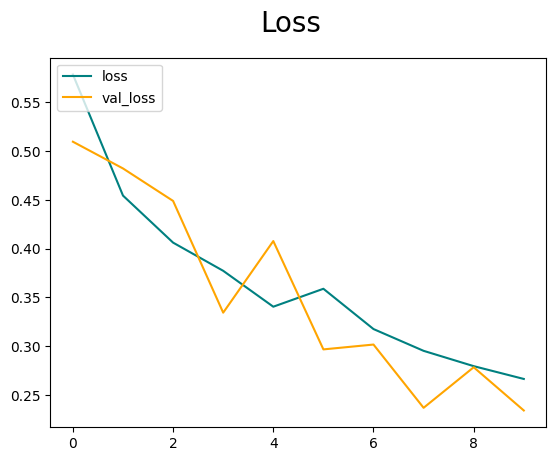

In [ ]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss') # training loss
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

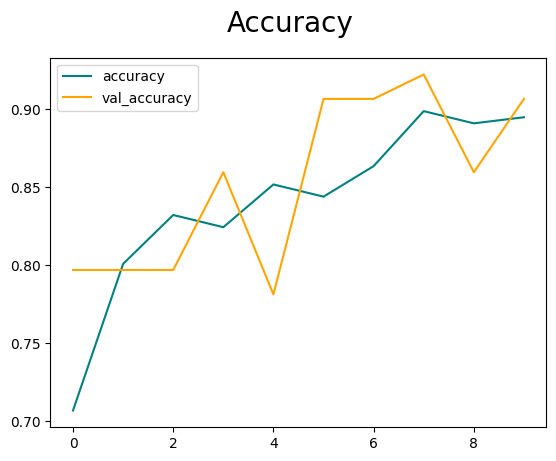

In [ ]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

### Evaluate Model

1/1 [==============================] - 7s 7s/step
(50,)
Precision: 0.9285714285714286
Recall: 0.9285714285714286
F1: 0.9285714285714286
ROC-AUC Score: 0.9918831168831168
Log Loss: 0.30197929724271627




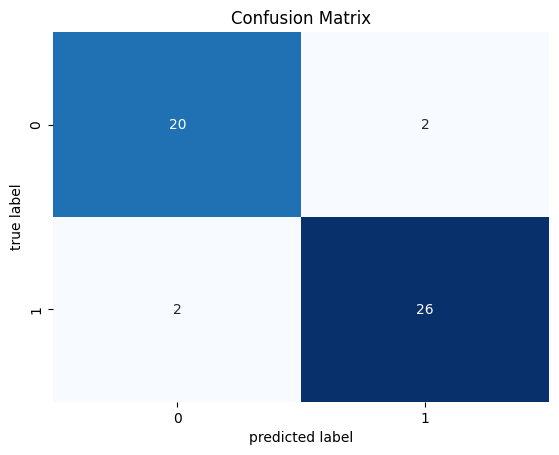

In [ ]:
# evaluate model
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, log_loss, roc_auc_score
import seaborn as sns

# create empty lists to store true labels and predicted probabilities
true_labels = []
predicted_probs = []

# for each batch in test set (which has 2 batches with total 50 images), make prediction
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)

    true_labels.extend(y)
    predicted_probs.extend(yhat)

# convert lists to arrays
true_labels = np.array(true_labels)
predicted_probs = np.array(predicted_probs)
# print(true_labels.shape, predicted_probs.shape)

# convert predicted probabilities (2d array) to required format (1d array only containing prob for class 1)
predicted_proba = predicted_probs.T[1]
# print(predicted_probs.shape, predicted_proba.shape)

# convert predicted probabilities to class predictions
predicted_classes = np.argmax(predicted_probs, axis=1) # want the index (0 or 1) with max value for each row
print(predicted_classes.shape)

# compute predicted classes based on a threshold
# predicted_classes = np.where(predicted_proba > 0.5, 1, 0)
# print(predicted_classes.shape)

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_classes)

# Compute perf metrics
precision = precision_score(true_labels, predicted_classes)
recall = recall_score(true_labels, predicted_classes)
f1 = f1_score(true_labels, predicted_classes) # do not name variable 'f1_score' as it is already a method
roc_auc = roc_auc_score(true_labels, predicted_proba)
logloss = log_loss(true_labels, predicted_proba)

sns.heatmap(conf_matrix, cmap='Blues', annot=True, fmt='g', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('predicted label')
plt.ylabel('true label');

print("Precision:", precision)
print("Recall:", recall)
print("F1:", f1)
print("ROC-AUC Score:", roc_auc)
print("Log Loss:", logloss)
print("\n")

### Test Using New Unseen Images

In [ ]:
data_dir = '/content/drive/MyDrive/Data/Image_Classification/unseen'
img_list = os.listdir(data_dir)
print('No. of images in unseen folder: {}'.format(len(img_list)))

No. of images in unseen folder: 12


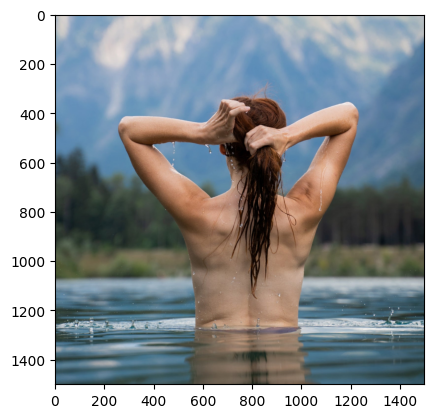

1/1 [==============================] - 0s 390ms/step
[[0.39178523 0.49282953]]




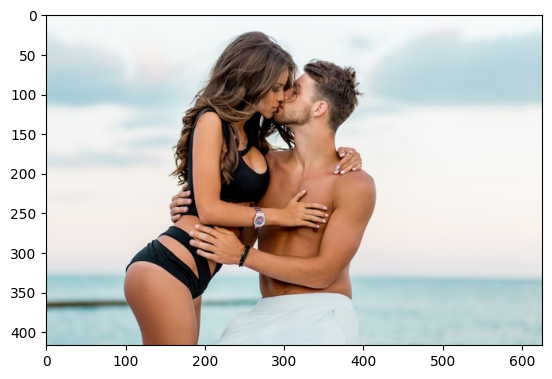

1/1 [==============================] - 0s 393ms/step
[[0.16917795 0.69277406]]




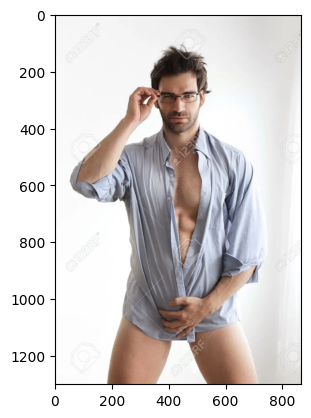

1/1 [==============================] - 0s 377ms/step
[[0.12167162 0.81614554]]




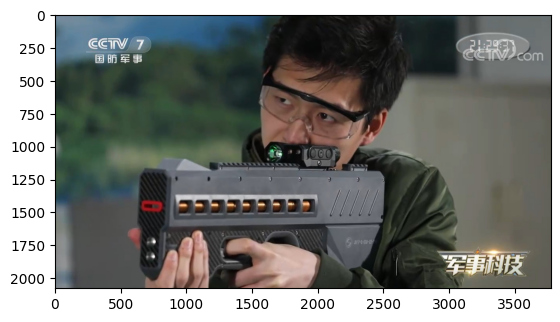

1/1 [==============================] - 1s 556ms/step
[[0.42247292 0.4124446 ]]




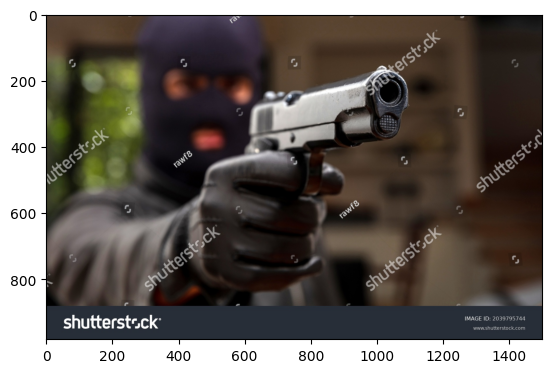

1/1 [==============================] - 0s 380ms/step
[[0.5135238  0.31756228]]




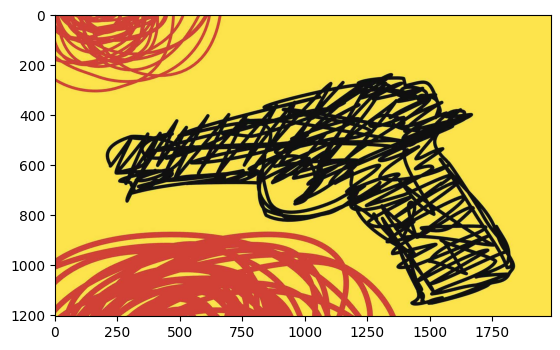

1/1 [==============================] - 0s 390ms/step
[[0.72053075 0.12107587]]




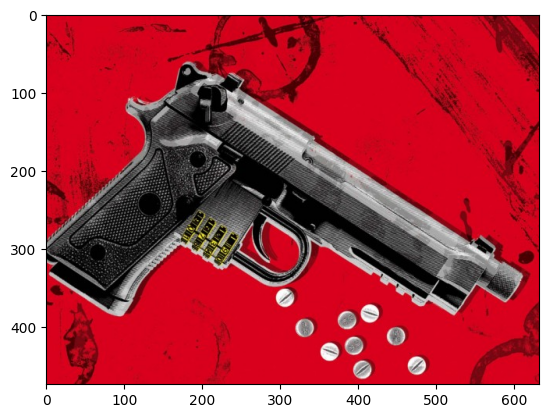

1/1 [==============================] - 0s 391ms/step
[[0.1440463 0.7200372]]




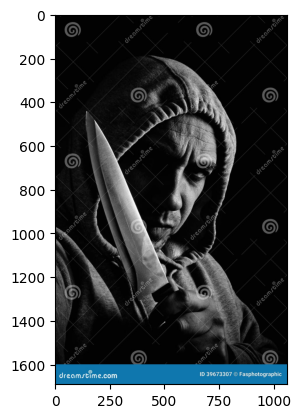

1/1 [==============================] - 0s 372ms/step
[[0.1324928 0.7970555]]




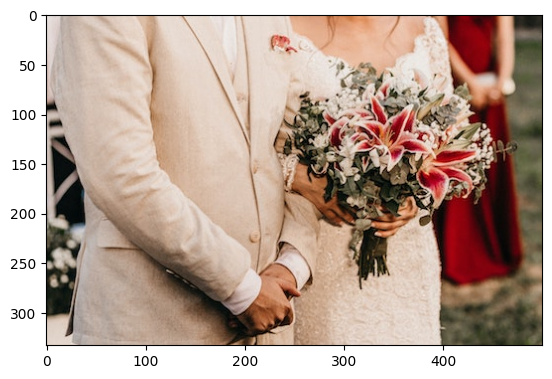

1/1 [==============================] - 0s 395ms/step
[[0.3918806 0.3733642]]




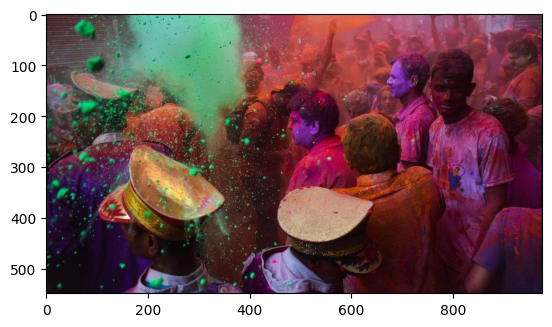

1/1 [==============================] - 0s 393ms/step
[[0.6656973  0.19783504]]




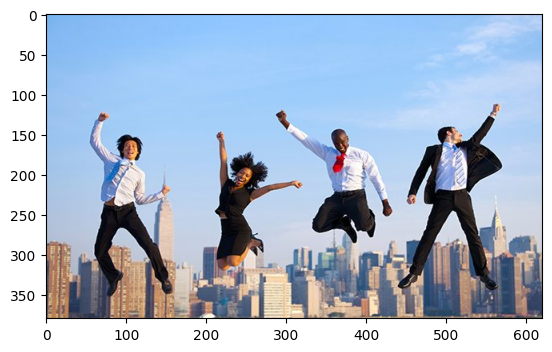

1/1 [==============================] - 0s 382ms/step
[[0.7344316  0.11513016]]




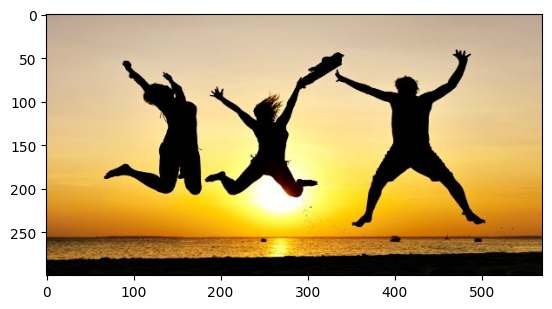

1/1 [==============================] - 0s 391ms/step
[[0.6050548 0.2029272]]




In [ ]:
pathway = '/content/drive/MyDrive/Data/Image_Classification/unseen/'
for image in img_list:
  img = cv2.imread(pathway+image)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show();

  resize = tf.image.resize(img, (224,224))
  yhat = model.predict(np.expand_dims(resize/255, 0))
  print(yhat)
  print("\n")

## Part 4: Transfer Learning (Fine Tuning)

### Load Libraries and Data Location

In [ ]:
data_dir = '/content/drive/MyDrive/Data/Image_Classification/data'
for image_class in os.listdir(data_dir):
    img_list = os.listdir(os.path.join(data_dir, image_class))
    print('No. of images in {} folder: {}'.format(image_class, len(img_list)))

# 186 unsafe, 184 safe

No. of images in unsafe folder: 186
No. of images in safe folder: 184


In [ ]:
# create data pipeline
# generates dataset from image files in directory
# input_size = (224, 224)  # VGG16 input size
data_dir = '/content/drive/MyDrive/Data/Image_Classification/data'
data = tf.keras.utils.image_dataset_from_directory(data_dir, image_size=(224,224))

len(data) # 12 batches

Found 370 files belonging to 2 classes.


12

In [ ]:
# need to scale as part of data pipeline
# map here is a function from the tf.data.Dataset API
# other common functions: zip (combine features and labels), skip
# maybe rename as scaled_data
data = data.map(lambda x,y: (x/255, y)) # use x,y as x is image values and y is class

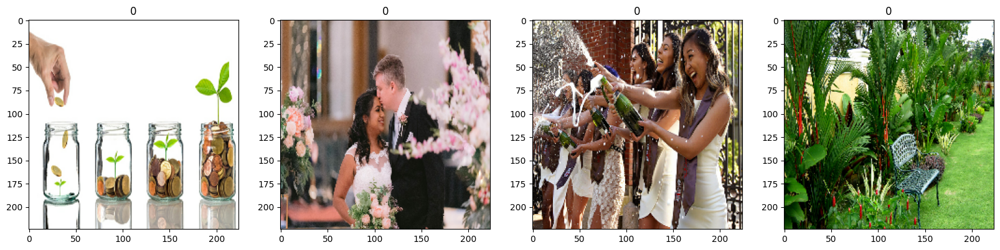

In [ ]:
# check scaled images still ok
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img) # img.astype(int) # can't cast as integer as image values are all between 0 and 1 now
    ax[idx].title.set_text(batch[1][idx])

### Split Data

In [ ]:
# train, val used during training (val used to evaluate during training)
train_size = int(len(data)*.7)
val_size = int(len(data)*.2)
test_size = int(len(data)*.1) + 1

print(train_size, val_size, test_size) # equals 12 batches

8 2 2


In [ ]:
# take: how much data we are taking
# skip: skip data
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size+val_size).take(test_size)

print(len(train), len(val), len(test))

8 2 2


In [ ]:
train

<_TakeDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

### Train Model

In [ ]:
from tensorflow.keras.applications import VGG16

# Load the pre-trained VGG16 model (excluding the top classification FC layers)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
base_model.trainable = True

# print the no. of layers in the base model
print("Number of layers in the base model: ", len(base_model.layers))

Number of layers in the base model:  19


In [ ]:
# fine-tune from this layer onwards
fine_tune_at = 14

# freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

In [ ]:
# Add custom layers for classification task
num_classes = 2
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)  # Use softmax for classification

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model with a lower learning rate for fine-tuning
optimizer = tf.keras.optimizers.Adam(lr=0.00001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
hist = model.fit(train, epochs=10, validation_data=val)

Epoch 1/10
8/8 [==============================] - 168s 21s/step - loss: 2.2441 - accuracy: 0.5781 - val_loss: 1.1440 - val_accuracy: 0.5938
Epoch 2/10
8/8 [==============================] - 153s 19s/step - loss: 0.9510 - accuracy: 0.5000 - val_loss: 0.8175 - val_accuracy: 0.4844
Epoch 3/10
8/8 [==============================] - 166s 21s/step - loss: 0.6863 - accuracy: 0.6016 - val_loss: 0.6472 - val_accuracy: 0.5625
Epoch 4/10
8/8 [==============================] - 155s 19s/step - loss: 0.7370 - accuracy: 0.5039 - val_loss: 0.6032 - val_accuracy: 0.7344
Epoch 5/10
8/8 [==============================] - 164s 21s/step - loss: 0.5959 - accuracy: 0.6602 - val_loss: 0.5101 - val_accuracy: 0.7188
Epoch 6/10
8/8 [==============================] - 153s 19s/step - loss: 0.4385 - accuracy: 0.8047 - val_loss: 0.4709 - val_accuracy: 0.7969
Epoch 7/10
8/8 [==============================] - 171s 21s/step - loss: 0.4275 - accuracy: 0.8008 - val_loss: 0.3298 - val_accuracy: 0.8750
Epoch 8/10
8/8 [====

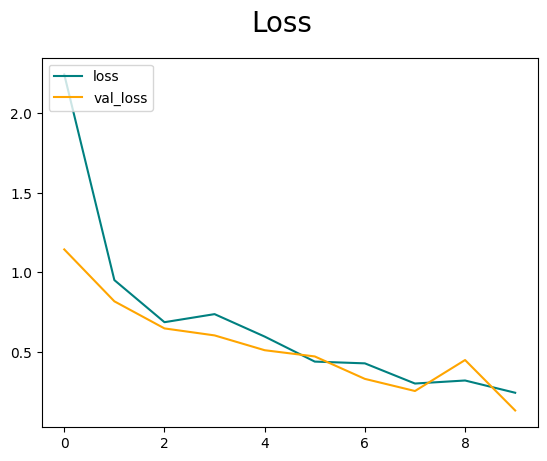

In [ ]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss') # training loss
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

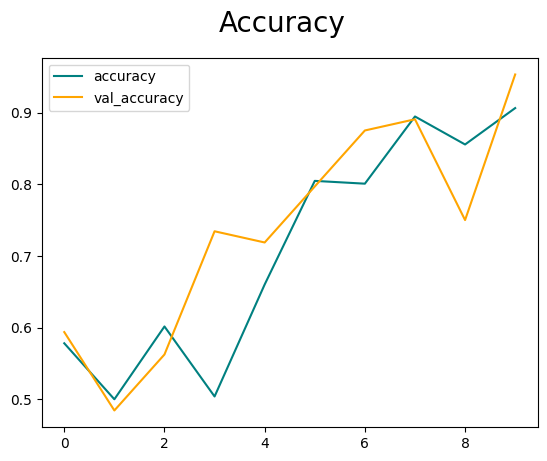

In [ ]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

### Evaluate Model

1/1 [==============================] - 8s 8s/step
(50,)
Precision: 0.8888888888888888
Recall: 0.96
F1: 0.923076923076923
ROC-AUC Score: 0.9808
Log Loss: 0.18881637628498726




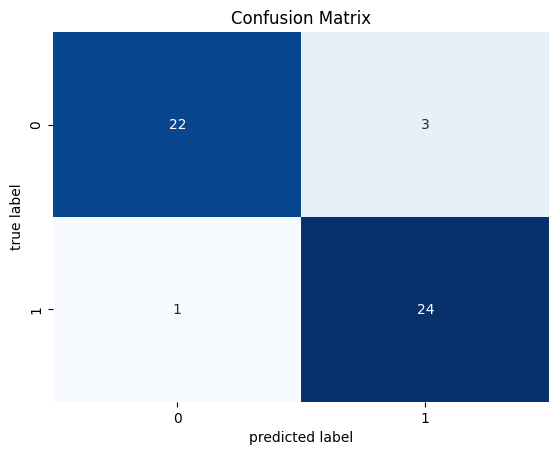

In [ ]:
# evaluate model
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, log_loss, roc_auc_score
import seaborn as sns

# create empty lists to store true labels and predicted probabilities
true_labels = []
predicted_probs = []

# for each batch in test set (which has 2 batches with total 50 images), make prediction
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)

    true_labels.extend(y)
    predicted_probs.extend(yhat)

# convert lists to arrays
true_labels = np.array(true_labels)
predicted_probs = np.array(predicted_probs)
# print(true_labels.shape, predicted_probs.shape)

# convert predicted probabilities (2d array) to required format (1d array only containing prob for class 1)
predicted_proba = predicted_probs.T[1]
# print(predicted_probs.shape, predicted_proba.shape)

# convert predicted probabilities to class predictions
predicted_classes = np.argmax(predicted_probs, axis=1) # want the index (0 or 1) with max value for each row
print(predicted_classes.shape)

# compute predicted classes based on a threshold
# predicted_classes = np.where(predicted_proba > 0.5, 1, 0)
# print(predicted_classes.shape)

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_classes)

# Compute perf metrics
precision = precision_score(true_labels, predicted_classes)
recall = recall_score(true_labels, predicted_classes)
f1 = f1_score(true_labels, predicted_classes) # do not name variable 'f1_score' as it is already a method
roc_auc = roc_auc_score(true_labels, predicted_proba)
logloss = log_loss(true_labels, predicted_proba)

sns.heatmap(conf_matrix, cmap='Blues', annot=True, fmt='g', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('predicted label')
plt.ylabel('true label');

print("Precision:", precision)
print("Recall:", recall)
print("F1:", f1)
print("ROC-AUC Score:", roc_auc)
print("Log Loss:", logloss)
print("\n")

### Test Using New Unseen Images

In [ ]:
data_dir = '/content/drive/MyDrive/Data/Image_Classification/unseen'
img_list = os.listdir(data_dir)
print('No. of images in unseen folder: {}'.format(len(img_list)))

No. of images in unseen folder: 12


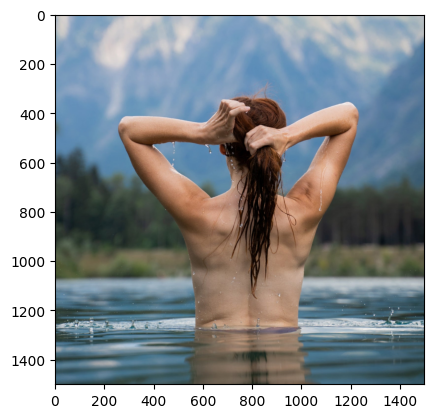

1/1 [==============================] - 0s 475ms/step
[[0.10601705 0.893983  ]]




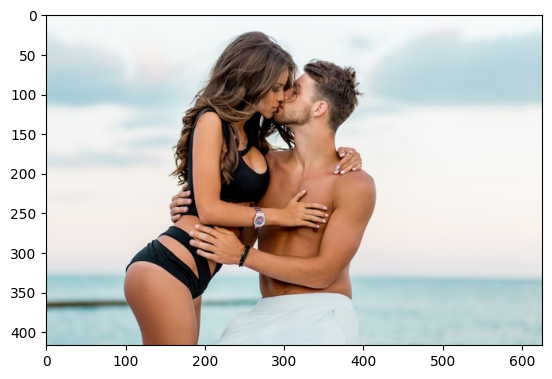

1/1 [==============================] - 0s 469ms/step
[[0.03985004 0.9601499 ]]




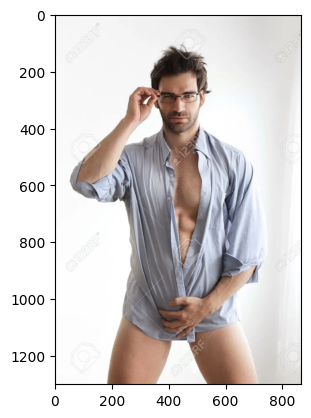

1/1 [==============================] - 0s 490ms/step
[[0.01282737 0.9871726 ]]




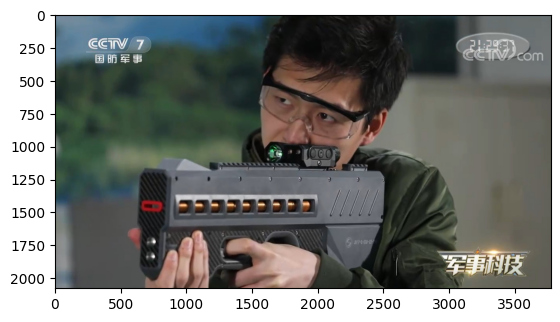

1/1 [==============================] - 0s 376ms/step
[[0.35113895 0.64886105]]




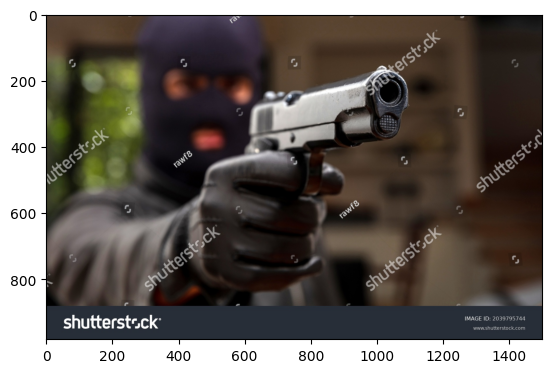

1/1 [==============================] - 0s 371ms/step
[[0.12318183 0.8768182 ]]




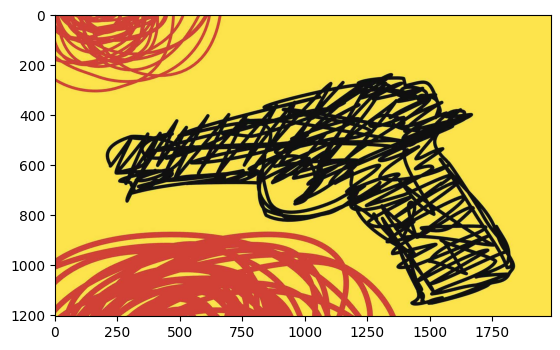

1/1 [==============================] - 1s 516ms/step
[[0.93596333 0.06403664]]




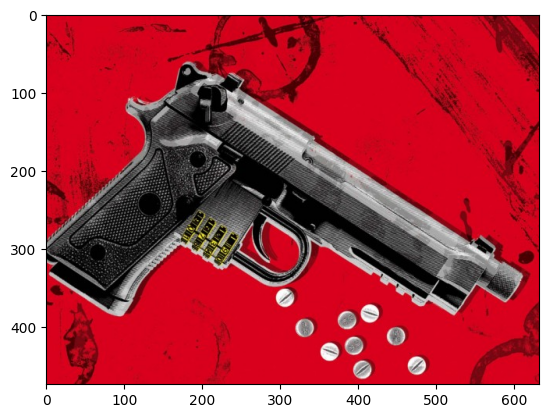

1/1 [==============================] - 1s 510ms/step
[[0.14453033 0.85546964]]




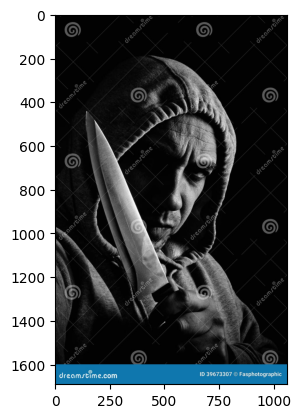

1/1 [==============================] - 0s 370ms/step
[[0.01505475 0.98494524]]




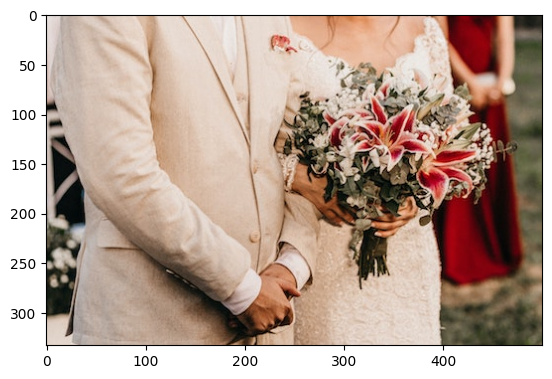

1/1 [==============================] - 1s 530ms/step
[[0.84741443 0.15258555]]




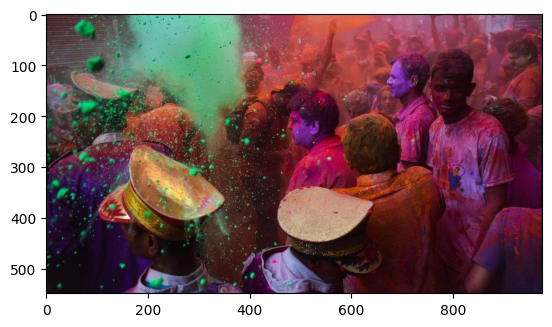

1/1 [==============================] - 0s 405ms/step
[[0.92260706 0.07739291]]




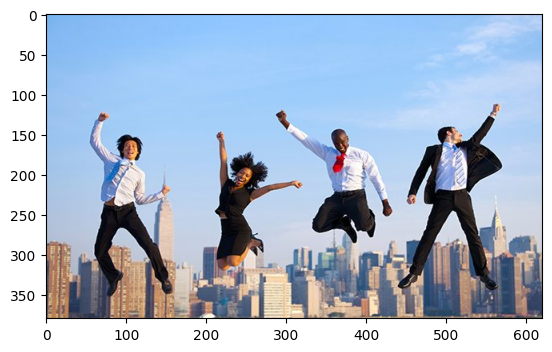

1/1 [==============================] - 0s 408ms/step
[[0.9879034  0.01209663]]




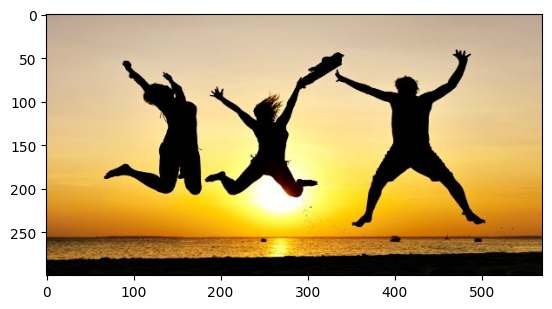

1/1 [==============================] - 0s 386ms/step
[[0.7425268  0.25747317]]




In [ ]:
pathway = '/content/drive/MyDrive/Data/Image_Classification/unseen/'
for image in img_list:
  img = cv2.imread(pathway+image)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show();

  resize = tf.image.resize(img, (224,224))
  yhat = model.predict(np.expand_dims(resize/255, 0))
  print(yhat)
  print("\n")